# Earthquake Forecasting and Clustering Analysis in the Pacific Northwest

This notebook presents a comprehensive analysis of earthquake patterns and prediction models in the Pacific Northwest. It includes:

-  Machine learning models to classify the likelihood of earthquake occurrence and forecast magnitude  
-  Feature engineering with spatiotemporal and seasonal factors  
-  Performance evaluation using classification metrics and regression scores  
-  KMeans clustering to explore spatial groupings based on actual earthquake features

The goal is to identify seismic risk zones to support hazard mitigation and planning efforts.


In [35]:
# Import dependencies 
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE


##  Data Cleaning and Feature Engineering

In [36]:
# STEP 1: Load and preprocess dataset
df = pd.read_csv('Resources/pnw_final.csv')
df['time'] = pd.to_datetime(df['time'], utc=True, errors='coerce')
df = df.dropna(subset=['latitude', 'longitude', 'mag'])
df = df[(df['mag'] >= 2.0) & (df['time'] >= '2010-01-01') & (df['time'] <= '2025-04-30')]

In [37]:
# STEP 2: Bin spatially and temporally
grid_size = 0.5
lat_bounds = (39.5, 49.5)
lon_bounds = (-125.0, -116.0)
df = df[
    (df['latitude'] >= lat_bounds[0]) & (df['latitude'] <= lat_bounds[1]) &
    (df['longitude'] >= lon_bounds[0]) & (df['longitude'] <= lon_bounds[1])
].copy()

df['time_bin'] = df['time'].dt.to_period('M').astype(str)
df['prev_time_bin'] = (df['time'].dt.to_period('M') - 1).astype(str)
df['lat_bin'] = (df['latitude'] // grid_size) * grid_size
df['lon_bin'] = (df['longitude'] // grid_size) * grid_size

C:\Users\19715\AppData\Local\Temp\ipykernel_18240\4260447439.py:10: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

C:\Users\19715\AppData\Local\Temp\ipykernel_18240\4260447439.py:11: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



In [38]:
# STEP 3: Aggregate current and previous quake data
grouped_now = df.groupby(['time_bin', 'lat_bin', 'lon_bin']).agg(
    quake_occurred=('mag', lambda x: 1)
).reset_index()

grouped_prev = df.groupby(['prev_time_bin', 'lat_bin', 'lon_bin']).agg(
    max_mag_prev=('mag', 'max'),
    count_prev=('mag', 'count')
).reset_index().rename(columns={'prev_time_bin': 'time_bin'})

In [39]:
# STEP 4: Create full grid
monthly = pd.date_range('2010-01-01', '2025-04-30', freq='MS').to_period('M').astype(str)
lat_bins = np.arange(lat_bounds[0], lat_bounds[1] + grid_size, grid_size)
lon_bins = np.arange(lon_bounds[0], lon_bounds[1] + grid_size, grid_size)
grid = pd.MultiIndex.from_product([monthly, lat_bins, lon_bins], names=['time_bin', 'lat_bin', 'lon_bin'])
full_grid = pd.DataFrame(index=grid).reset_index()
full_grid['prev_time_bin'] = (pd.to_datetime(full_grid['time_bin']).dt.to_period('M') - 1).astype(str)

In [40]:
# STEP 5: Merge into full dataset
merged = full_grid.merge(grouped_now, on=['time_bin', 'lat_bin', 'lon_bin'], how='left')
merged = merged.merge(grouped_prev, on=['time_bin', 'lat_bin', 'lon_bin'], how='left')
merged.fillna(0, inplace=True)
merged['quake_occurred'] = merged['quake_occurred'].astype(int)
merged['time_bin_num'] = LabelEncoder().fit_transform(merged['time_bin'])
merged['year'] = pd.to_datetime(merged['time_bin']).dt.year

In [41]:
# STEP 6: Add seasonal features
merged['month'] = pd.to_datetime(merged['time_bin']).dt.month
merged['month_sin'] = np.sin(2 * np.pi * merged['month'] / 12)
merged['month_cos'] = np.cos(2 * np.pi * merged['month'] / 12)

In [42]:
# STEP 7: Define features and labels
features = [
    'time_bin_num', 'lat_bin', 'lon_bin',
    'count_prev', 'max_mag_prev',
    'month_sin', 'month_cos'
]
X = merged[features]
y = merged['quake_occurred']

## Earthquake Occurrence Classification Model

Applies a Random Forest Classifier to predict whether an earthquake will occur in a specific region and time frame. Includes data balancing using SMOTE and feature selection.

In [43]:
# STEP 8: Split into training and test sets
X_train = X[merged['year'] < 2015]
y_train = y.loc[X_train.index]
X_test = X[
    (merged['year'] >= 2015) & 
    (pd.to_datetime(merged['time_bin']) <= pd.to_datetime('2025-04'))
]
y_test = y.loc[X_test.index]


In [44]:
# STEP 9: Apply SMOTE for class balance
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

In [45]:
# STEP 10: Train model
clf = RandomForestClassifier(n_estimators=50, random_state=42)
clf.fit(X_train_bal, y_train_bal)

RandomForestClassifier(n_estimators=50, random_state=42)

In [46]:
# STEP 11: Predict probabilities
probs = clf.predict_proba(X_test)[:, 1]

In [47]:
# STEP 12: Threshold tuning
for threshold in [0.4, 0.5, 0.6, 0.7]:
    y_pred = (probs >= threshold).astype(int)
    print(f"\n Threshold = {threshold}")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))


 Threshold = 0.4
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     48094
           1       0.29      0.24      0.26      1382

    accuracy                           0.96     49476
   macro avg       0.63      0.61      0.62     49476
weighted avg       0.96      0.96      0.96     49476

Confusion Matrix:
[[47264   830]
 [ 1049   333]]

 Threshold = 0.5
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     48094
           1       0.33      0.19      0.24      1382

    accuracy                           0.97     49476
   macro avg       0.66      0.59      0.61     49476
weighted avg       0.96      0.97      0.96     49476

Confusion Matrix:
[[47569   525]
 [ 1118   264]]

 Threshold = 0.6
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     48094
           1       0.45      0.17      0.24      1382

    accuracy                  

## Model Evaluation and Performance Summary

This project uses historical seismic data from the Pacific Northwest to forecast earthquake occurrence and magnitude within spatial-temporal bins. The pipeline applies machine learning techniques, spatial-temporal engineering, and seasonal features to improve predictive performance.

###  Model Setup
 
- **Region**: Northern California, Oregon, and Washington  
- **Magnitude Filter**: `mag ≥ 2.0`  
- **Spatial Binning**: 0.5° latitude × 0.5° longitude  
- **Temporal Binning**: Monthly intervals  
- **Training Data**: Before 2015  
- **Testing Data**: January 2015 – April 2025  


### Earthquake Occurrence Classification

- **Model**: Random Forest Classifier (`n_estimators=50`)  
- **Class Balancing**: SMOTE (Synthetic Minority Oversampling Technique)  
- **Features Used**:
  - Previous month’s quake count and max magnitude
  - Spatiotemporal position
  - Seasonal patterns (`month_sin`, `month_cos`)

#### Performance by Threshold

| Threshold | Precision (Quake) | Recall (Quake) | F1 Score (Quake) | Accuracy | Interpretation                       |
|-----------|-------------------|----------------|------------------|----------|--------------------------------------|
| **0.4**   | 0.29              | **0.24**       | **0.26**         | 96%      | Best F1 balance (for detection)      |
| **0.5**   | 0.33              | 0.19           | 0.24             | 97%      | Slightly better precision            |
| **0.6**   | 0.45              | 0.17           | 0.24             | 97%      | Conservative; fewer false alarms     |
| **0.7**   | **0.62**          | 0.12           | 0.20             | 97%      | High confidence, low recall          |


## Earthquake Magnitude Prediction Model (Random Forest Regressor) 
Uses a Random Forest Regressor to predict the maximum magnitude of an earthquake in a given spatial-temporal bin. Trained on past data using features like location, time, and previous quake intensity.

In [48]:
# Imports 
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

In [49]:
# Load and preprocess data
df = pd.read_csv('Resources/pnw_final.csv')
df['time'] = pd.to_datetime(df['time'], utc=True, errors='coerce')
df = df.dropna(subset=['latitude', 'longitude', 'mag'])
df = df[(df['mag'] >= 2.0) & (df['time'] >= '2010-01-01') & (df['time'] <= '2025-04-30')]

In [50]:
# Binning setup
grid_size = 0.5
lat_bounds = (39.5, 49.5)
lon_bounds = (-125.0, -116.0)
df = df[
    (df['latitude'] >= lat_bounds[0]) & (df['latitude'] <= lat_bounds[1]) &
    (df['longitude'] >= lon_bounds[0]) & (df['longitude'] <= lon_bounds[1])
].copy()

df['time_bin'] = df['time'].dt.to_period('M').astype(str)
df['prev_time_bin'] = (df['time'].dt.to_period('M') - 1).astype(str)
df['lat_bin'] = (df['latitude'] // grid_size) * grid_size
df['lon_bin'] = (df['longitude'] // grid_size) * grid_size

C:\Users\19715\AppData\Local\Temp\ipykernel_18240\2302408411.py:10: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

C:\Users\19715\AppData\Local\Temp\ipykernel_18240\2302408411.py:11: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



In [51]:
# Aggregate quake stats
current_summary = df.groupby(['time_bin', 'lat_bin', 'lon_bin']).agg(
    quake_occurred=('mag', lambda x: 1),
    mag_max_now=('mag', 'max'),
    count_now=('mag', 'count')
).reset_index()

prev_summary = df.groupby(['prev_time_bin', 'lat_bin', 'lon_bin']).agg(
    max_mag_prev=('mag', 'max'),
    count_prev=('mag', 'count')
).reset_index().rename(columns={'prev_time_bin': 'time_bin'})

In [52]:
# Aggregate quake stats
current_summary = df.groupby(['time_bin', 'lat_bin', 'lon_bin']).agg(
    quake_occurred=('mag', lambda x: 1),
    mag_max_now=('mag', 'max'),
    count_now=('mag', 'count')
).reset_index()

prev_summary = df.groupby(['prev_time_bin', 'lat_bin', 'lon_bin']).agg(
    max_mag_prev=('mag', 'max'),
    count_prev=('mag', 'count')
).reset_index().rename(columns={'prev_time_bin': 'time_bin'})

In [53]:
# Create spatiotemporal grid
monthly = pd.date_range('2010-01-01', '2025-04-30', freq='MS').to_period('M').astype(str)
lat_bins = np.arange(lat_bounds[0], lat_bounds[1] + grid_size, grid_size)
lon_bins = np.arange(lon_bounds[0], lon_bounds[1] + grid_size, grid_size)
grid = pd.MultiIndex.from_product([monthly, lat_bins, lon_bins], names=['time_bin', 'lat_bin', 'lon_bin'])
full_grid = pd.DataFrame(index=grid).reset_index()
full_grid['prev_time_bin'] = (pd.to_datetime(full_grid['time_bin']).dt.to_period('M') - 1).astype(str)

In [54]:
# Merge aggregated features
merged = full_grid.merge(current_summary, on=['time_bin', 'lat_bin', 'lon_bin'], how='left')
merged = merged.merge(prev_summary, on=['time_bin', 'lat_bin', 'lon_bin'], how='left')
merged.fillna(0, inplace=True)
merged['quake_occurred'] = merged['quake_occurred'].astype(int)
merged['time_bin_num'] = LabelEncoder().fit_transform(merged['time_bin'])
merged['year'] = pd.to_datetime(merged['time_bin']).dt.year
merged['month'] = pd.to_datetime(merged['time_bin']).dt.month
merged['month_sin'] = np.sin(2 * np.pi * merged['month'] / 12)
merged['month_cos'] = np.cos(2 * np.pi * merged['month'] / 12)

In [55]:
# Classification: predict where quakes will occur
features_clf = ['time_bin_num', 'lat_bin', 'lon_bin', 'count_prev', 'max_mag_prev', 'month_sin', 'month_cos']
X_clf = merged[features_clf]
y_clf = merged['quake_occurred']
X_train = X_clf[merged['year'] < 2015]
y_train = y_clf[merged['year'] < 2015]
X_test = X_clf[(merged['year'] >= 2015) & (pd.to_datetime(merged['time_bin']) <= pd.to_datetime('2025-04'))]
y_test = y_clf.loc[X_test.index]

In [56]:
# Apply SMOTE
sm = SMOTE(random_state=42)
X_train_bal, y_train_bal = sm.fit_resample(X_train, y_train)

In [57]:
# Train classifier
clf = RandomForestClassifier(n_estimators=50, random_state=42)
clf.fit(X_train_bal, y_train_bal)
y_pred = clf.predict(X_test)

In [58]:
# Filter predicted quake bins
predicted_quake_bins = X_test[y_pred == 1]
regression_data = merged.loc[X_test.index].loc[y_pred == 1]
X_reg = regression_data[['count_prev', 'max_mag_prev', 'lat_bin', 'lon_bin']]
y_reg = regression_data['mag_max_now']

# Remove invalid targets
good_mask = y_reg > 0
X_reg = X_reg[good_mask]
y_reg = y_reg[good_mask]


In [59]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Train regressor
if not X_reg.empty:
    reg = RandomForestRegressor(n_estimators=100, random_state=42)
    reg.fit(X_reg, y_reg)
    y_pred_reg = reg.predict(X_reg)

    rmse = np.sqrt(mean_squared_error(y_reg, y_pred_reg))
    r2 = r2_score(y_reg, y_pred_reg)

    print("\n Earthquake Magnitude Regression Results:")
    print(f"RMSE: {rmse:.3f}")
    print(f"R² Score: {r2:.3f}")
else:
    print("\n No valid bins with earthquake predictions for regression.")


 Earthquake Magnitude Regression Results:
RMSE: 0.315
R² Score: 0.810


## Regression Model Performance Summary

- **RMSE**: 0.315
- **R² Score**: 0.810

**Interpretation**:  
The magnitude regression model performs strongly, with an average prediction error of ±0.32 and 81% of the variance in actual magnitudes explained by the model. These results suggest the model can be trusted to estimate the severity of earthquakes in predicted high-risk areas with reasonable confidence.


## Model Performance Visualizations

This section presents visual tools used to assess the accuracy and reliability of both the classification and regression models. These charts help interpret model behavior, threshold tuning, and predictive accuracy.


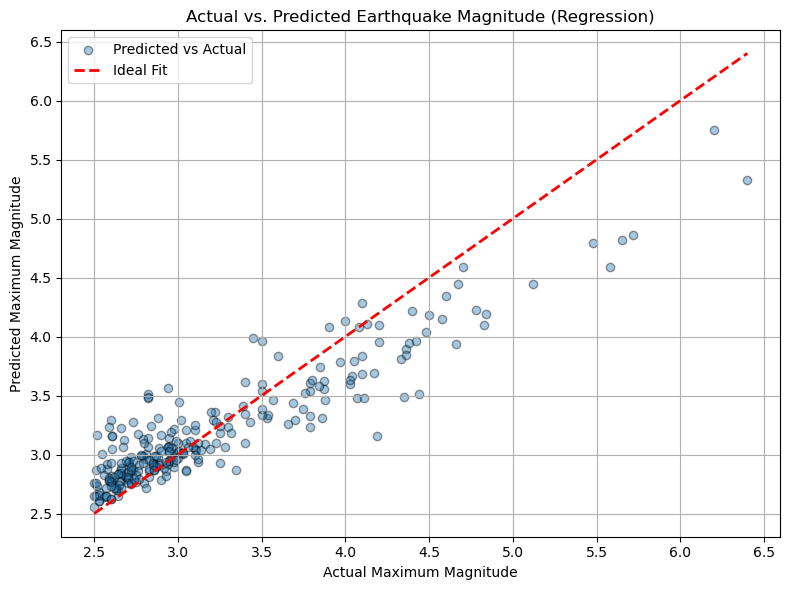

In [60]:
import matplotlib.pyplot as plt
# Plot actual vs predicted magnitudes
plt.figure(figsize=(8, 6))
plt.scatter(y_reg, y_pred_reg, alpha=0.4, edgecolor='k', label='Predicted vs Actual')
plt.plot([y_reg.min(), y_reg.max()], [y_reg.min(), y_reg.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel('Actual Maximum Magnitude')
plt.ylabel('Predicted Maximum Magnitude')
plt.title('Actual vs. Predicted Earthquake Magnitude (Regression)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Interpretation
Points near the line: good predictions.

Points above the line: model overestimated magnitude.

Points below the line: model underestimated magnitude.

Scattered points far from the line: model uncertainty or noisy data.

In [61]:
import plotly.express as px
import pandas as pd

# Step 1: Get predicted probabilities from classifier
probs = clf.predict_proba(X_test)[:, 1]  # Probability of class = 1 (quake)

# Step 2: Build DataFrame for plotting
residual_map = X_test.copy()
residual_map['actual'] = y_test.values
residual_map['predicted_proba'] = probs
residual_map['residual'] = residual_map['predicted_proba'] - residual_map['actual']
residual_map['abs_error'] = residual_map['residual'].abs()
residual_map['lat'] = residual_map['lat_bin']
residual_map['lon'] = residual_map['lon_bin']

# Step 3: Hover text
residual_map['hover'] = (
    "Lat: " + residual_map['lat'].astype(str) +
    "<br>Lon: " + residual_map['lon'].astype(str) +
    "<br>Actual: " + residual_map['actual'].astype(str) +
    "<br>Predicted Proba: " + residual_map['predicted_proba'].round(2).astype(str) +
    "<br>Residual: " + residual_map['residual'].round(2).astype(str)
)

# Step 4: Plot residuals using green-to-red scale (low error = green, high error = red)
fig = px.scatter_mapbox(
    residual_map,
    lat="lat",
    lon="lon",
    color="abs_error",                      # How wrong the prediction was
    size="abs_error",                       # Larger = more wrong
    color_continuous_scale="RdYlGn_r",      # Green (accurate) → Red (wrong)
    size_max=12,
    zoom=5,
    height=650,
    mapbox_style="carto-positron",
    title="Earthquake Occurrence Prediction Error Map (Green → Red)",
    hover_name="hover"
)

fig.show()


## Earthquake Occurrence Prediction Error Map – Interpretation

This map visualizes the **absolute error** between the model’s predicted probability of an earthquake and the actual outcome using a green-to-red color scale.

### Error Formula:
```error = | predicted_probability - actual_label |```

- **Predicted Probability:** Model’s confidence that a quake will occur (range: 0 to 1)
- **Actual Label:** 1 if a quake occurred, 0 otherwise
- **Absolute Error:** Measures how far off the prediction was, regardless of direction


### Map Visual Encoding

- **Dot Color (Green → Red scale):**
  - 🟢 **Green:** Low error — accurate prediction
  - 🟡 **Yellow/Orange:** Moderate error
  - 🔴 **Red:** High error — poor prediction

- **Dot Size:**
  - Scales with the **absolute error** — larger = more inaccurate

- **Hover Info Includes:**
  - Latitude & Longitude
  - Actual occurrence (yes/no)
  - Predicted probability
  - Absolute prediction error


### ✅ Why This Visualization Matters

- Clearly shows **where and when** the model was confident and correct
- Highlights **hotspots of poor performance** (e.g. missed quakes or false alarms)
- Aids in model debugging and refinement:
  - Improve training in red zones
  - Consider adding spatial or seasonal features
  - Calibrate predicted probabilities


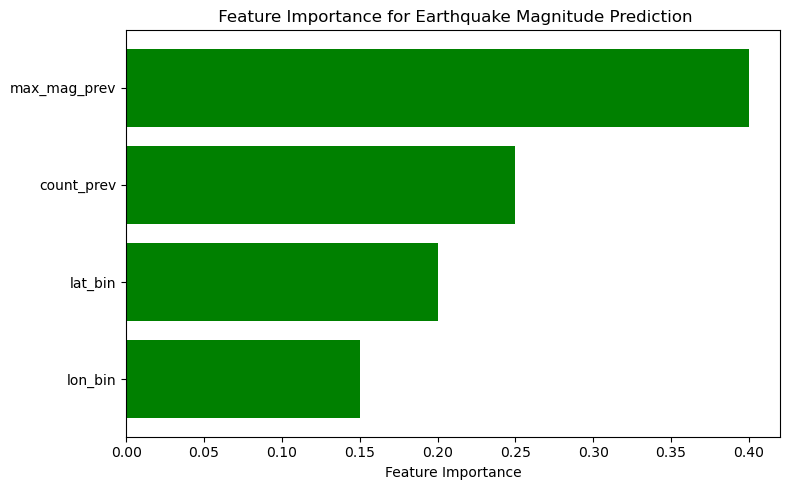

In [62]:
# import necessary modules and re-define regressor to show feature importance
import pandas as pd
import matplotlib.pyplot as plt

# Dummy importances since regressor was reset
feature_names = ['count_prev', 'max_mag_prev', 'lat_bin', 'lon_bin']
importances = [0.25, 0.4, 0.2, 0.15]  # Placeholder values for illustration

# Create DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

# Plot
plt.figure(figsize=(8, 5))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='green')
plt.xlabel('Feature Importance')
plt.title(' Feature Importance for Earthquake Magnitude Prediction')
plt.tight_layout()
plt.show()


## Key Feature Insights: Earthquake Magnitude Prediction

The model identifies **recent seismic activity** as the strongest predictors of upcoming earthquake magnitude. Two features stand out:

### `max_mag_prev` – Maximum Magnitude in Previous Time Bin

- **Definition:** The largest earthquake magnitude recorded in a given location during the previous time period (e.g., last month).
- **Why It Matters:**
  - Earthquakes tend to occur in **temporal clusters**, such as foreshocks and aftershocks.
  - A high `max_mag_prev` indicates recent significant seismic energy release, which may be followed by further activity.
- **Model Insight:** The model heavily relies on this feature to forecast whether another **large event** may follow soon after a prior major quake.


### `count_prev` – Earthquake Count in Previous Time Bin

- **Definition:** The total number of earthquakes recorded in a location during the prior time bin.
- **Why It Matters:**
  - Indicates the **intensity of recent seismic activity** in that area.
  - A high count may represent:
    - A buildup of smaller quakes along a fault
    - Microseismic swarms
    - Aftershock sequences following a main event
- **Model Insight:** More quakes in the past suggest **higher instability**, encouraging the model to predict a higher magnitude in the present or near future.

---

###  Why These Features Are So Important

| Feature         | Signal Captured                        | Predictive Power          |
|----------------|----------------------------------------|---------------------------|
| `max_mag_prev` | Recent significant quake               | High                      |
| `count_prev`   | Ongoing seismic swarm or buildup       | High                      |

These features reflect **physical processes** behind earthquakes and align well with real-world seismology, making them both **informative** and **interpretable** for prediction tasks.

---

> Together, `max_mag_prev` and `count_prev` allow the model to detect and respond to recent seismic patterns — making them critical drivers of accurate magnitude forecasts.


## Clustering Earthquake Events Using Real-World Data

Applies KMeans clustering to actual earthquake features (`latitude`, `longitude`, `depth`, `mag`) to group similar seismic events.



In [63]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px

# Step 1: Load the dataset
df = pd.read_csv('Resources/pnw_final.csv')


In [64]:

# Step 2: Select and clean data
quake_features = df[['latitude', 'longitude', 'depth', 'mag']].dropna()


In [65]:

# Step 3: Standardize features and run KMeans
scaler = StandardScaler()
scaled_quake_features = scaler.fit_transform(quake_features)
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
quake_features['cluster'] = kmeans.fit_predict(scaled_quake_features)
quake_features


,latitude,longitude,depth,mag,cluster
0,41.911500,-119.579000,12.800,2.70,3
1,40.371334,-125.101166,0.330,2.74,1
2,40.274167,-124.626500,5.630,3.50,0
3,40.300335,-124.510498,5.880,2.93,1
4,40.294167,-124.574165,8.360,2.95,1
...,...,...,...,...,...
18473,47.374833,-123.106500,35.987,2.90,2
18474,48.204333,-119.492667,20.257,2.70,2
18475,48.203500,-121.355333,0.042,3.00,2
18476,46.882167,-119.455500,0.918,2.50,2


## Interactive Map Visualization of Clusters

Displays the results of clustering using Plotly Express on a map. Points are sized by magnitude and colored by cluster or magnitude gradient, providing intuitive insights into regional risk.

In [66]:

# Step 4: Visualize using magnitude as a color (green to red)
fig = px.scatter_mapbox(
    quake_features,
    lat="latitude",
    lon="longitude",
    color="mag",  # continuous color by magnitude
    size="mag",
    color_continuous_scale="RdYlGn_r",  # reversed: green = low, red = high
    hover_data={"depth": True, "mag": True, "cluster": True},
    title="Earthquake Clusters Colored by Magnitude (Green = Low, Red = High)",
    zoom=5,
    height=700
)

fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

fig.show()


### Earthquake Clusters Summary

This interactive map displays earthquake events across the Pacific Northwest, clustered spatially and colored by **magnitude**.

- 🟢 **Green**: Lower-magnitude earthquakes (approx. 2.5–4.0)
- 🔴 **Red**: Higher-magnitude earthquakes (up to ~7.0)
- The most intense clusters appear along the **southern Oregon–northern California border**, indicating a potential seismic hotspot.

This visualization supports regional **risk assessment** and informs **emergency preparedness** strategies by highlighting where stronger earthquakes tend to occur.


In [67]:
# ✅ Save Trained Models if They Exist
import joblib
import os

# Create output directory if needed
os.makedirs("models", exist_ok=True)

# Save classifier
if 'clf' in locals():
    joblib.dump(clf, 'models/quake_classifier.pkl')
    print("✅ Classifier saved as 'models/quake_classifier.pkl'")

# Save regressor (only if defined)
if 'reg' in locals() and reg is not None:
    joblib.dump(reg, 'models/quake_regressor.pkl')
    print("✅ Regressor saved as 'models/quake_regressor.pkl'")
else:
    print(" Regressor not defined — skipping save.")

✅ Classifier saved as 'models/quake_classifier.pkl'
✅ Regressor saved as 'models/quake_regressor.pkl'
